/var/folders/p3/6stw4jm14dngmbnyg6c5z9jm0000gq/T/ipykernel_33508/1682206187.py:8: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(file_name, sr=44100, offset=50.0, duration=30.0)  # 50秒から30秒間だけ


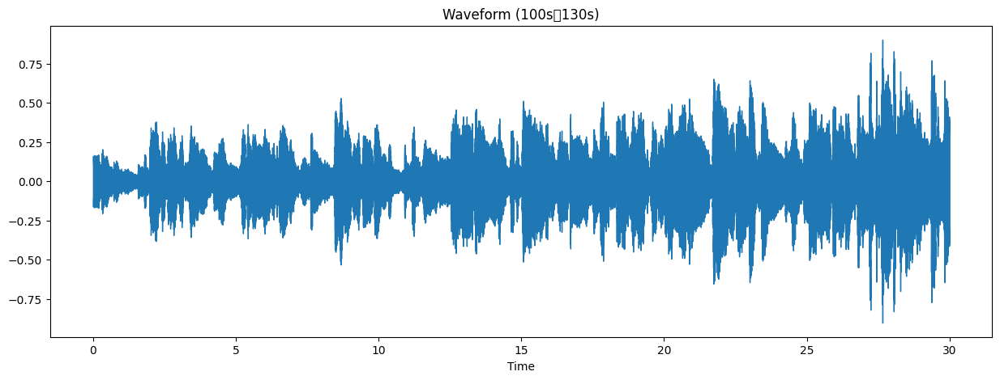

In [31]:
import numpy as np
import matplotlib.pyplot as plt
import IPython.display
import librosa
import librosa.display
# ファイルの読み込み
file_name = '/Users/ev230046/Music/Music/Media.localized/Music/The Beatles/Let It Be/06 Let It Be.m4a'
y, sr = librosa.load(file_name, sr=44100, offset=50.0, duration=30.0)  # 50秒から30秒間だけ

# 波形の振幅エンベロープをプロット
plt.figure(figsize=(15, 5))
librosa.display.waveshow(y, sr=sr)
plt.title("Waveform (100s〜130s)")
plt.show()

In [32]:
display(Audio(y, rate=sr))

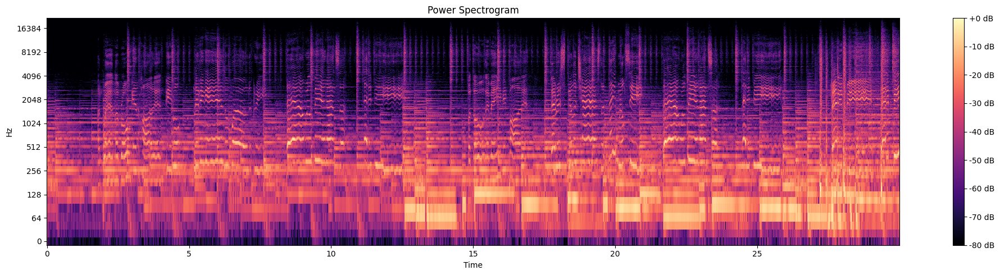

In [33]:
#Short-time Fourier transform (短時間フーリエ変換)
#音声など時間変化する信号の周波数と位相（の変化）の解析
stft_result = librosa.stft(y)
abs_result = np.abs(stft_result)
power_spec = librosa.amplitude_to_db(abs_result, ref=np.max)

plt.figure(figsize=(20,5))
librosa.display.specshow(power_spec, y_axis='log', x_axis='time', sr = sr)
plt.title('Power Spectrogram')
plt.colorbar(format='%+2.0f dB')

plt.tight_layout()
plt.show()



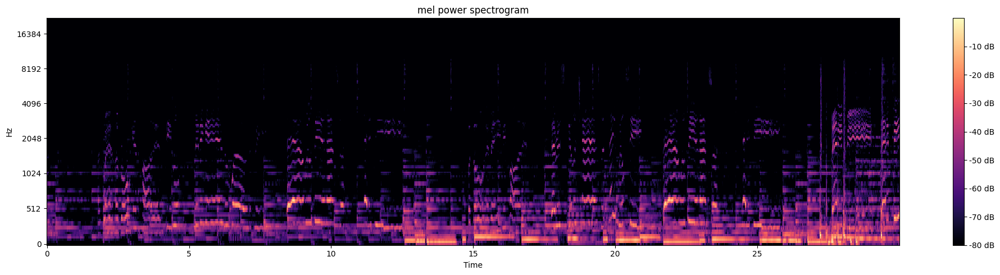

In [34]:

#mer spectrogram 周波数の分布を求める
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128)
log_S = librosa.amplitude_to_db(S, ref=np.max)

plt.figure(figsize=(20, 5))
librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel')
plt.title('mel power spectrogram')
plt.colorbar(format='%02.0f dB')
plt.tight_layout()



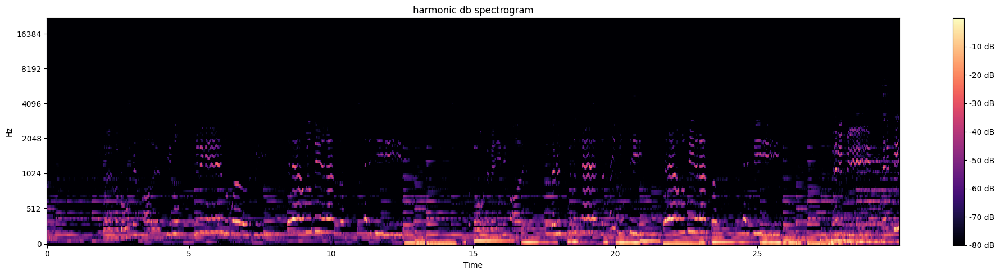

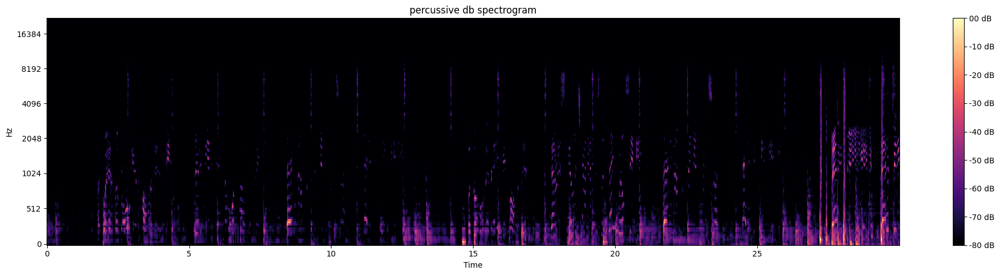

In [35]:
#ハーモニー部分とパーカッション部分の分離
y_harmonic, y_percussive = librosa.effects.hpss(y)

H = librosa.feature.melspectrogram(y = y_harmonic ,n_mels=128)
log_H = librosa.amplitude_to_db(H, ref=np.max)

#ハーモニー部分描画
plt.figure(figsize=(20, 5))
librosa.display.specshow(log_H, sr=sr, x_axis='time', y_axis='mel')
plt.title('harmonic db spectrogram')
plt.colorbar(format='%02.0f dB')
plt.tight_layout()

P = librosa.feature.melspectrogram(y=y_percussive, n_mels=128)
log_P = librosa.amplitude_to_db(P, ref=np.max)

#パーカッション部分描画
plt.figure(figsize=(20, 5))
librosa.display.specshow(log_P, sr=sr, x_axis='time', y_axis='mel')
plt.title('percussive db spectrogram')
plt.colorbar(format='%02.0f dB')
plt.tight_layout()


In [36]:
# 分離した音の再生（JupyterやColab用）
from IPython.display import Audio

display(Audio(y, rate=sr))

print("🎵 ハーモニー部分を再生:")
display(Audio(y_harmonic, rate=sr))

print("🥁 パーカッション部分を再生:")
display(Audio(y_percussive, rate=sr))


🎵 ハーモニー部分を再生:


🥁 パーカッション部分を再生:


違う周波数を組み合わせて流してみる。

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import IPython.display
import librosa
import librosa.display

from IPython.display import Audio
# ファイルの読み込み
file_name = '/Users/ev230046/Music/Music/Media.localized/Music/The Beatles/Let It Be/06 Let It Be.m4a'
y, sr = librosa.load(file_name, sr=44100, offset=50.0, duration=30.0)  # 100秒から30秒間だけ

display(Audio(y, rate=sr))

/var/folders/p3/6stw4jm14dngmbnyg6c5z9jm0000gq/T/ipykernel_33508/3362076128.py:10: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(file_name, sr=44100, offset=50.0, duration=30.0)  # 100秒から30秒間だけ


In [29]:
import numpy as np
import sounddevice as sd

fs = 44100             # Sampling frequency (samples per second)
duration = 2           # Duration in seconds
f = 440                # Frequency of sine wave (Hz)

t = np.arange(0, duration, 1/fs)  # Time vector
y = np.sin(2 * np.pi * f * t)     # Generate sine wave

sd.play(y, fs)         # Play the sound
sd.wait()              # Wait until the sound finishes playing


In [8]:
import numpy as np
import sounddevice as sd

fs = 44100             # Sampling frequency (samples per second)
duration = 2           # Duration in seconds
f = 440                # Frequency of sine wave (Hz)

t = np.arange(0, duration, 1/fs)  # Time vector
y = np.sin(2 * np.pi * f * t)     # Generate sine wave

sd.play(y, fs)         # Play the sound
sd.wait()              # Wait until the sound finishes playing


In [1]:
import numpy as np
import sounddevice as sd

fs = 44100             # Sampling frequency (samples per second)
duration = 2           # Duration in seconds
f = 440                # Frequency of sine wave (Hz)

t = np.arange(0, duration, 1/fs)  # Time vector
y = np.sin(2 * np.pi * f * t)     # Sine wave
z = np.cos(20 * np.pi * f * t) / 10  # High-frequency cosine wave
noise = np.random.rand(len(t))       # Random noise between 0 and 1

signal = y + z + noise               # Composite signal

sd.play(signal, fs)                  # Play the sound
sd.wait()                            # Wait until playback is done


/var/folders/p3/6stw4jm14dngmbnyg6c5z9jm0000gq/T/ipykernel_52643/615745681.py:9: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(file_name, sr=44100, offset=100.0, duration=30.0)  # 100秒から30秒間だけ


RuntimeError: No mappable was found to use for colorbar creation. First define a mappable such as an image (with imshow) or a contour set (with contourf).

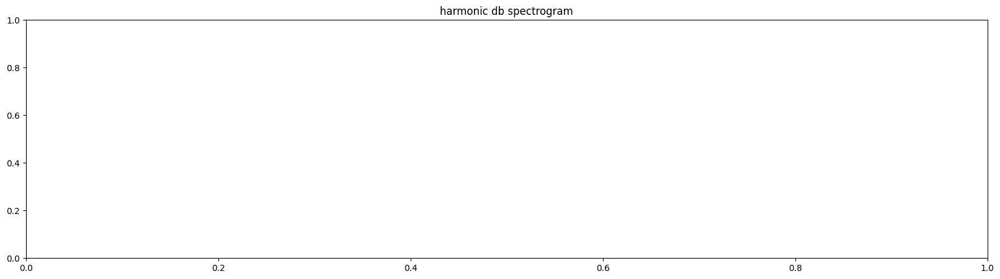

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import IPython.display
import librosa
import librosa.display

# ファイルの読み込み
file_name = '/Users/ev230046/Music/Music/Media.localized/Music/The Beatles/Let It Be/06 Let It Be.m4a'
y, sr = librosa.load(file_name, sr=44100, offset=100.0, duration=30.0)  # 100秒から30秒間だけ


#ハーモニー部分とパーカッション部分の分離
y_harmonic, y_percussive = librosa.effects.hpss(y)

H = librosa.feature.melspectrogram(y = y_harmonic ,n_mels=128)
log_H = librosa.amplitude_to_db(H, ref=np.max)

#ハーモニー部分描画
plt.figure(figsize=(20, 5))
#librosa.display.specshow(log_H, sr=sr, x_axis='time', y_axis='mel')
plt.title('harmonic db spectrogram')
plt.colorbar(format='%02.0f dB')
plt.tight_layout()

P = librosa.feature.melspectrogram(y=y_percussive, n_mels=128)
log_P = librosa.amplitude_to_db(P, ref=np.max)

plt.plot(log_H[:, 1000])
plt.title('Mel-Spectrogram at Time Frame 1000')
plt.xlabel('Mel Frequency Bin')
plt.ylabel('Amplitude (dB)')
plt.grid(True)
plt.show()

